In [1]:
import json
import numpy as np
import scipy as sp
import skimage.filters as skf
import sys
import warnings
import matplotlib.pyplot as plt
import math
import stemtool as st
%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams.update({'font.size': 25})
plt.rcParams.update({'font.weight': 'bold'})
plt.rcParams.update({'figure.autolayout': True})

In [2]:
folder_loc = '/home/qz7/Data/TMD 4D-STEM/Nion Swift Library 20190126 MoSe2 CVD B17/'
data_num = 'Data1'
st.tic()
Data_4D = np.load(folder_loc+data_num+'_4D.npy')
json_4D = folder_loc+data_num+'_4D.json'
DataADF = np.load(folder_loc+data_num+'_ADF.npy')
jsonADF = folder_loc+data_num+'_ADF.json'
with open(json_4D) as json__4D:
    info_4D = json.load(json__4D)
with open(jsonADF) as json_ADF:
    infoADF = json.load(json_ADF)
st.toc()

Elapsed time: 3.673627 seconds.



In [3]:
scan_calib_vals = infoADF['spatial_calibrations'][0]['scale']
scan_calib_unit = infoADF['spatial_calibrations'][0]['units']

In [4]:
DPC = st.dpc.atomic_dpc(Data_4D, DataADF, 1000*infoADF['spatial_calibrations'][0]['scale'], 60, 32)

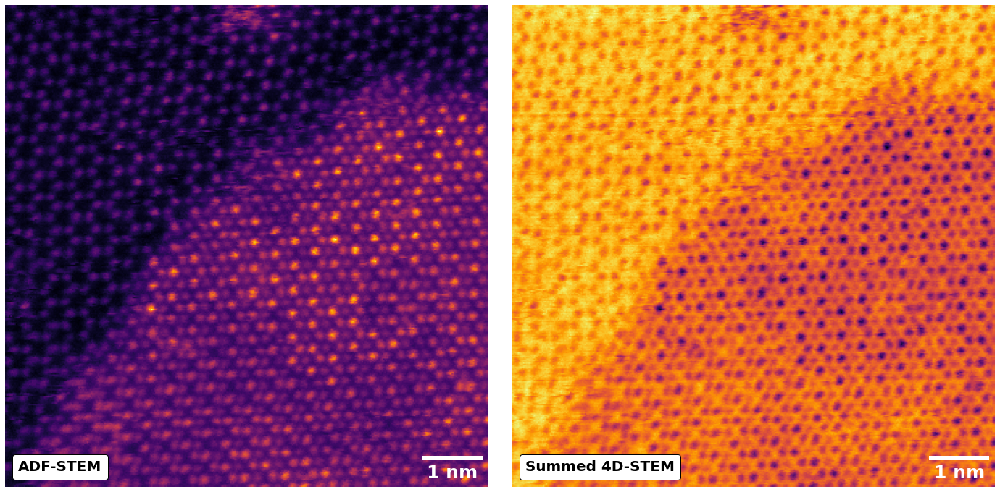

In [5]:
DPC.show_ADF_BF()

Elapsed time: 1.028974 seconds.



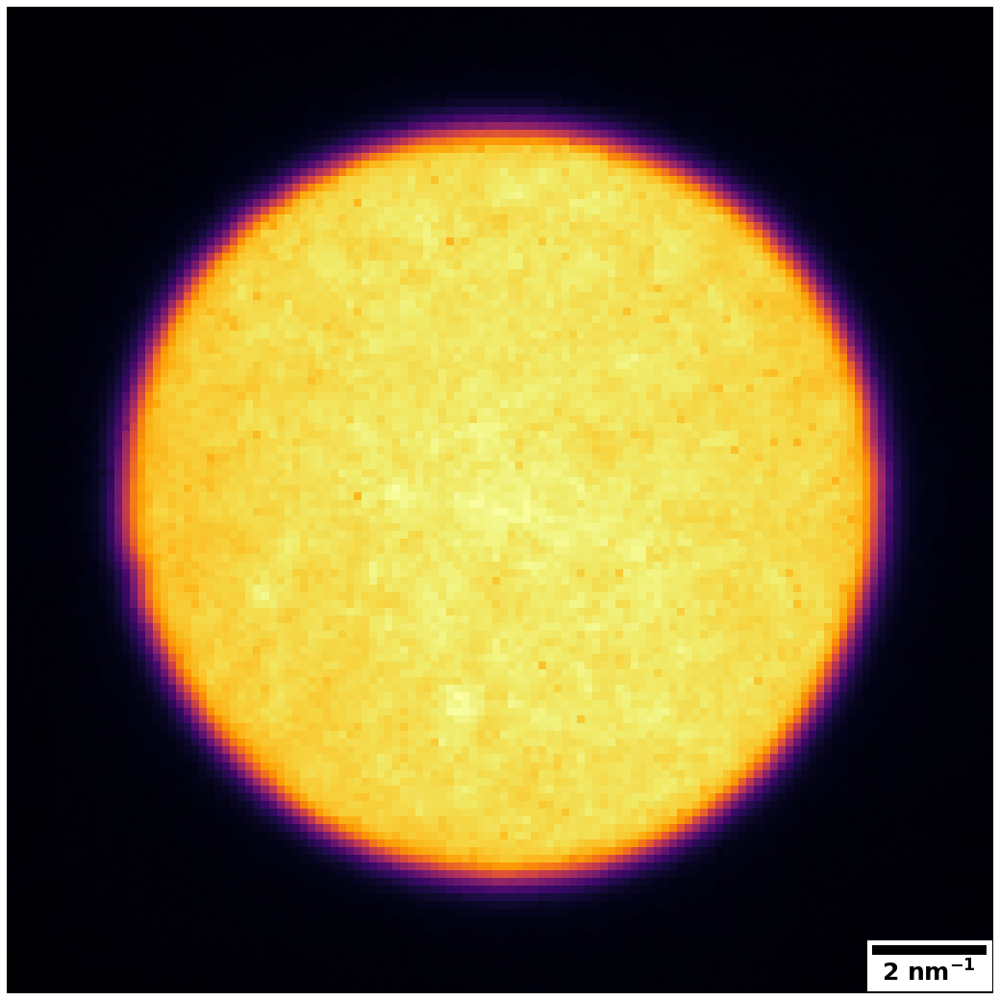

In [6]:
st.tic()
DPC.get_cbed(show_image = True)
st.toc()

Elapsed time: 9.115731 seconds.



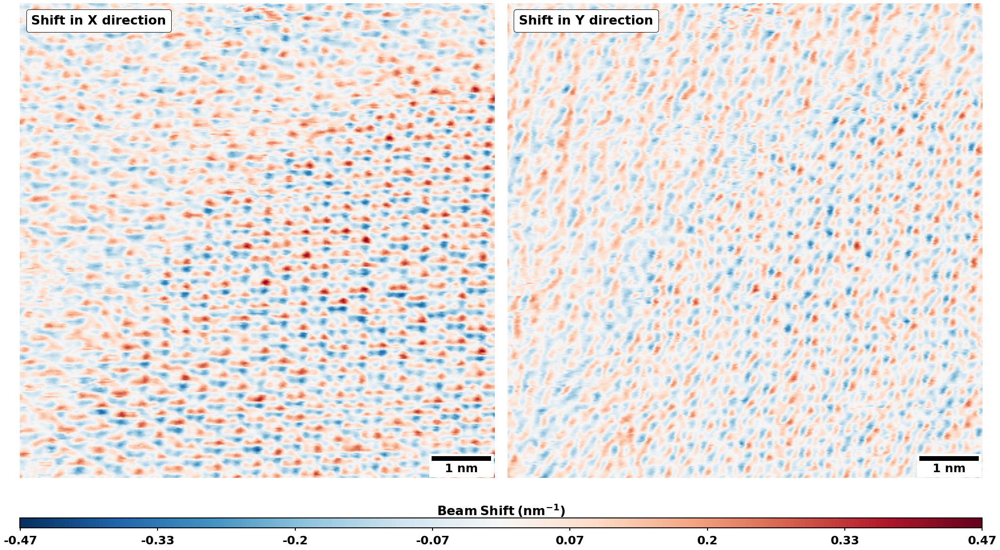

In [7]:
st.tic()
DPC.initial_dpc()
st.toc()

Elapsed time: 1.532905 seconds.



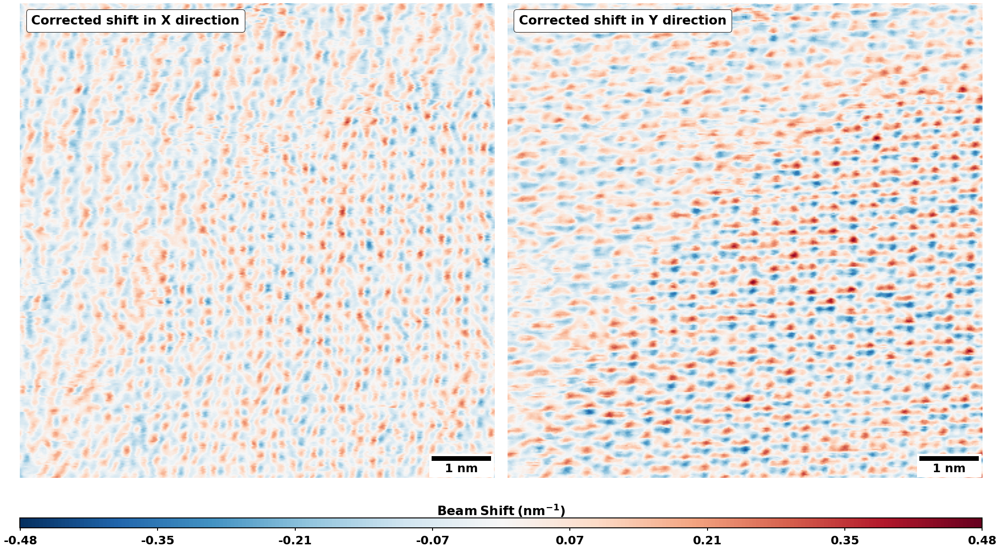

In [8]:
st.tic()
DPC.correct_dpc()
st.toc()

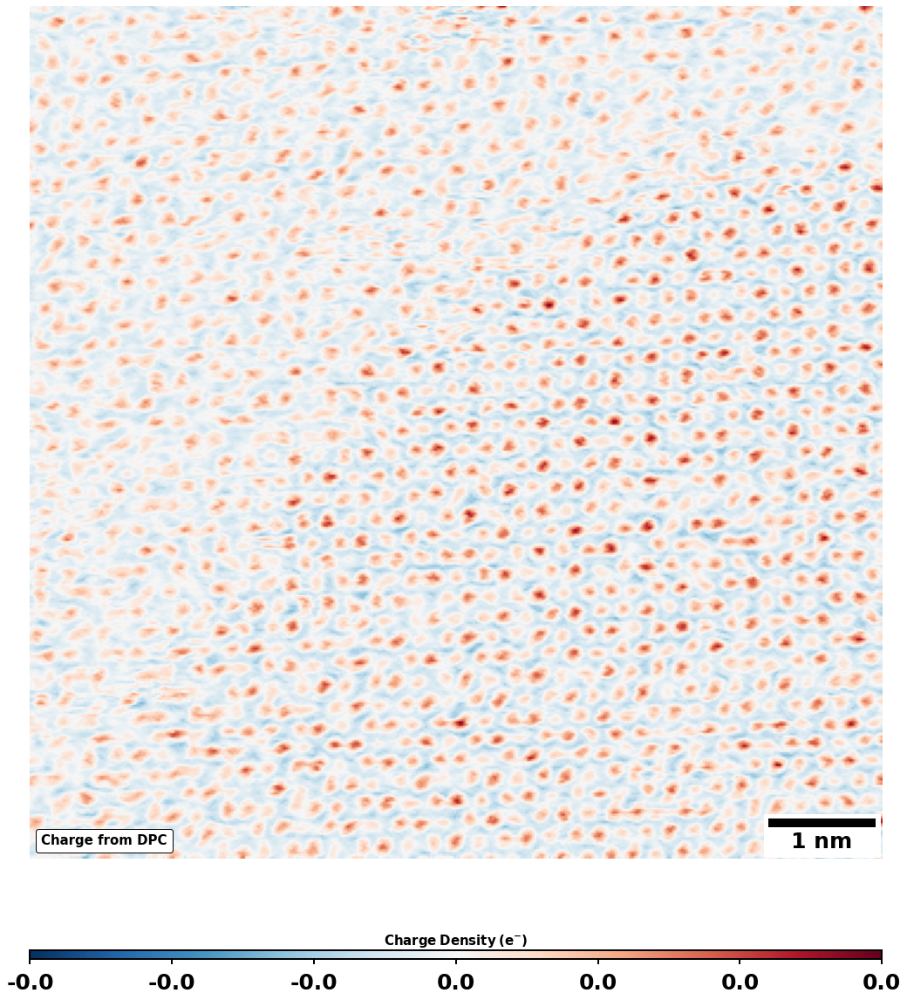

In [9]:
DPC.show_charge()

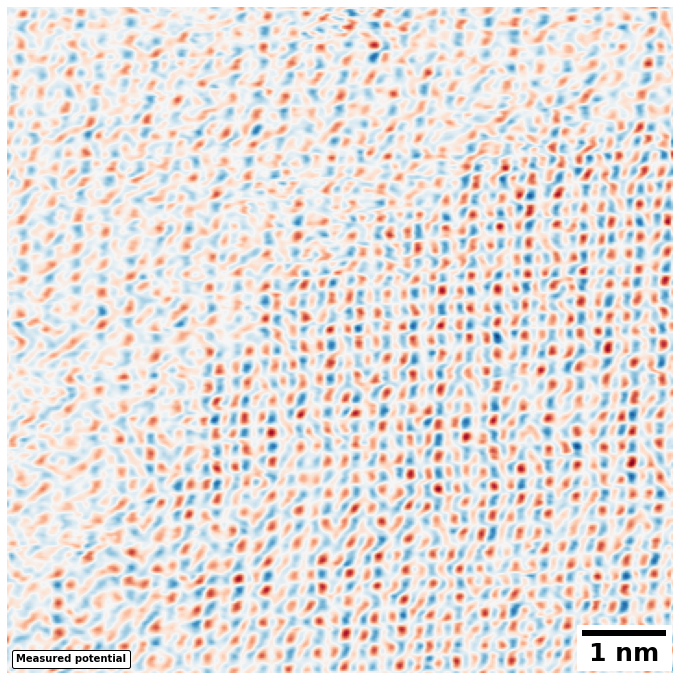

In [10]:
DPC.show_potential()

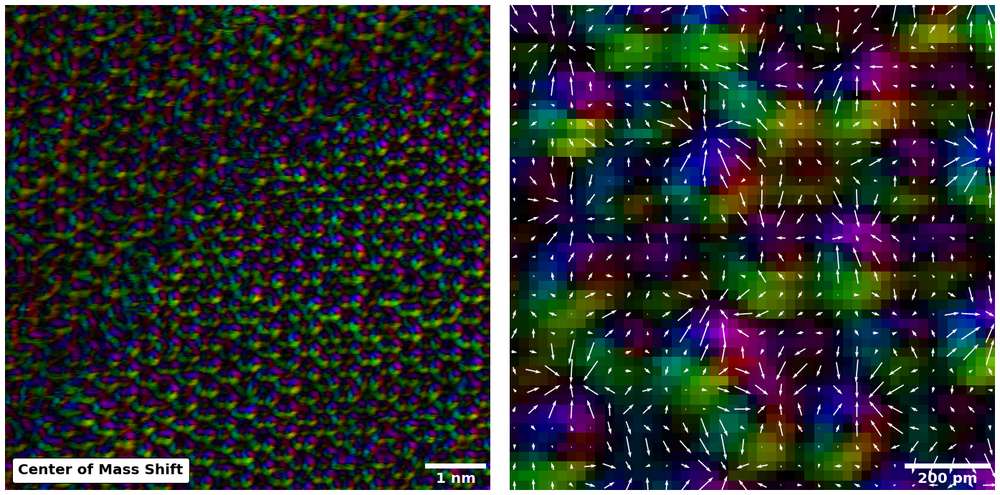

In [11]:
DPC.plot_color_dpc()

In [12]:
DPC.__dict__.keys()

dict_keys(['data_adf', 'data_4D', 'calib', 'voltage', 'wavelength', 'aperture', 'planck', 'epsilon0', 'e_charge', 'data_bf', 'cbed', 'beam_x', 'beam_y', 'beam_r', 'inverse', 'YCom', 'XCom', 'angle', 'final_flip', 'XComC', 'YComC', 'MomentumX', 'MomentumY', 'e_fieldX', 'e_fieldY', 'charge', 'potential'])

In [13]:
xs = DPC.XComC - np.mean(DPC.XComC)
ys = DPC.YComC - np.mean(DPC.YComC)

Elapsed time: 15.382970 seconds.



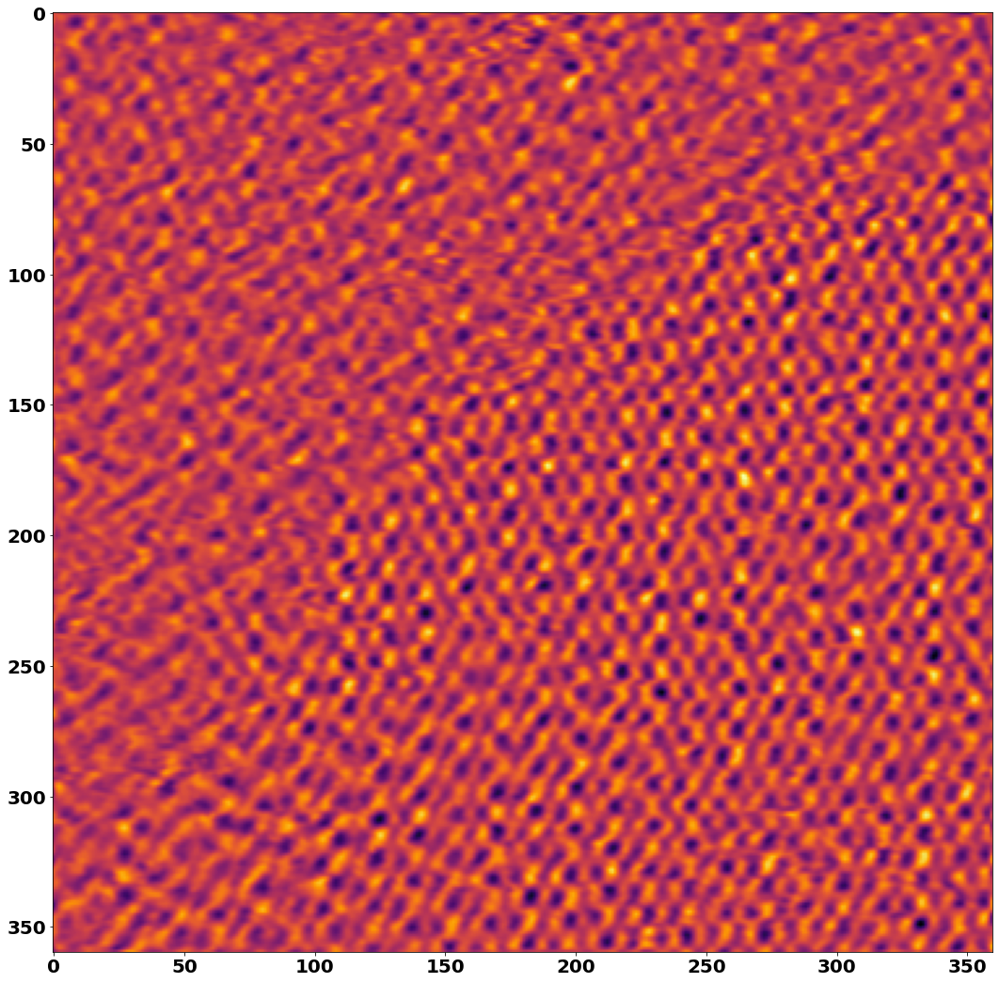

In [14]:
st.tic()
plt.figure(figsize=(15, 15))
pott = st.dpc.integrate_dpc(xs*DPC.wavelength, ys*DPC.wavelength)
plt.imshow(pott)
st.toc()